Mon Dec  4 01:42:45 2023

cvt_2d_sampling_test():
  Python version: 3.11.5
  Test cvt_2d_sampling()

cvt_2d_sampling():
  Python version: 3.11.5
  Use sampling to approximate Lloyd's algorithm
  in the 2D unit square.

  Number of generators is 16
  Number of iterations is 20
  Number of 1d samples is 100
  Number of 2d samples is 10000


C:\Users\temka\AppData\Local\Temp\ipykernel_34664\2992781711.py:136: DeprecationWarning: scipy.inner is deprecated and will be removed in SciPy 2.0.0, use numpy.inner instead
  k = [ argmin ( [ inner ( gg - ss, gg - ss ) for gg in g ] ) for ss in s ]
C:\Users\temka\AppData\Local\Temp\ipykernel_34664\2992781711.py:136: DeprecationWarning: scipy.argmin is deprecated and will be removed in SciPy 2.0.0, use numpy.argmin instead
  k = [ argmin ( [ inner ( gg - ss, gg - ss ) for gg in g ] ) for ss in s ]


  Graphics saved as " initial.png "


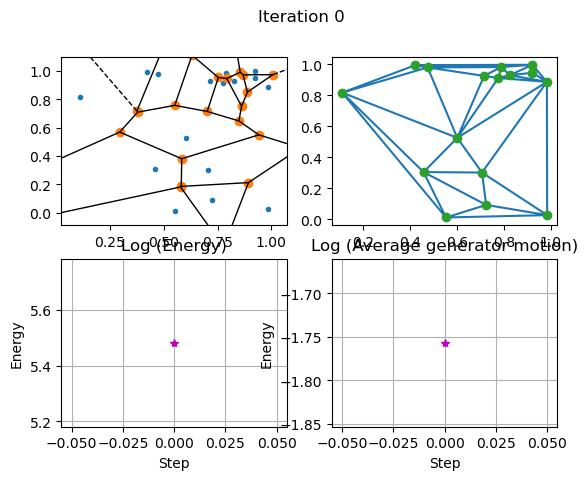

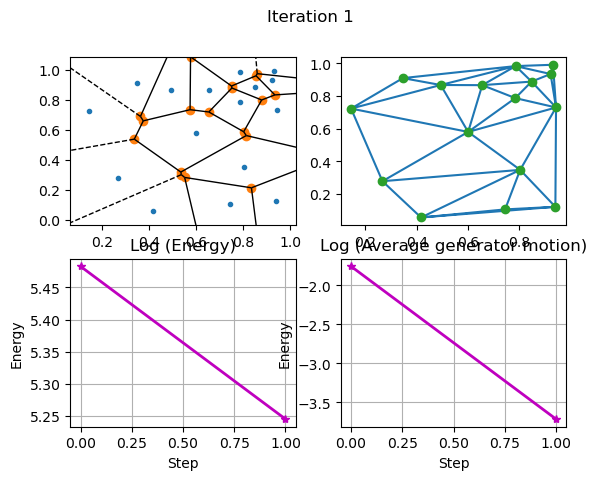

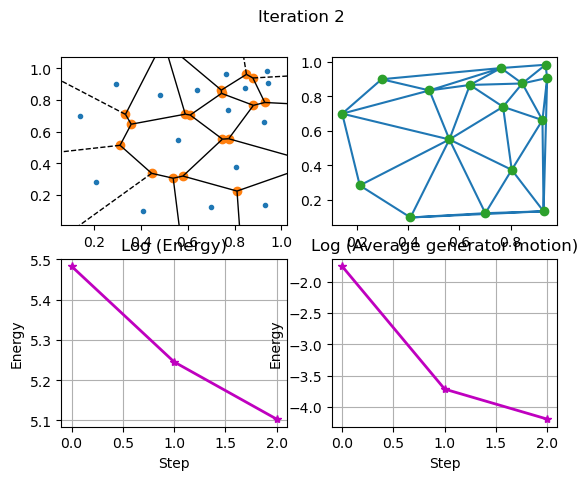

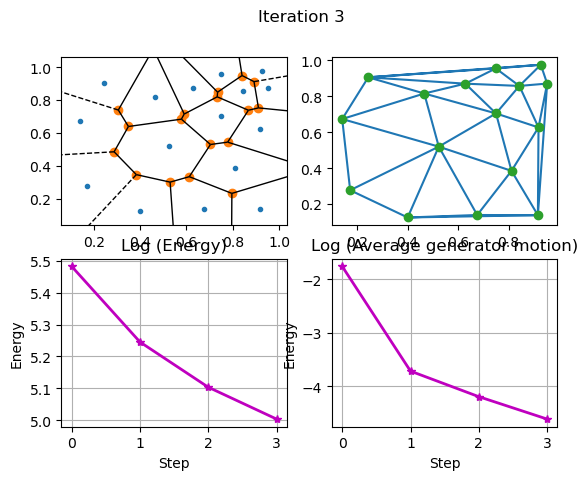

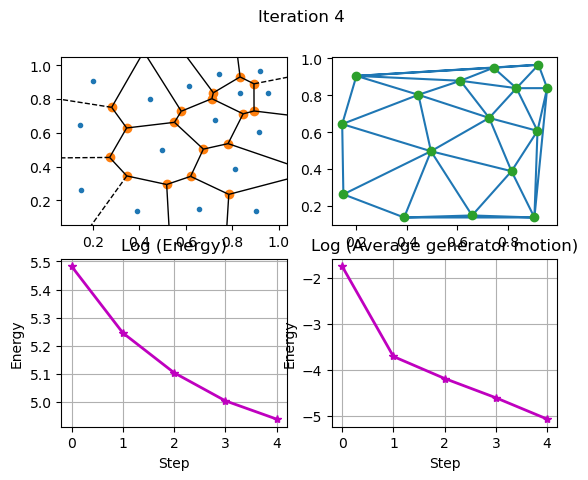

...

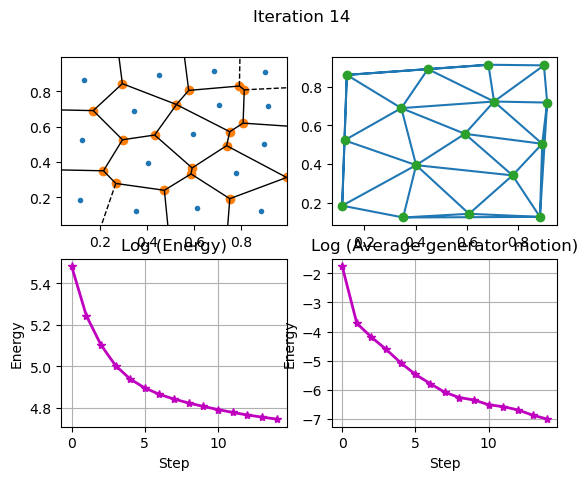

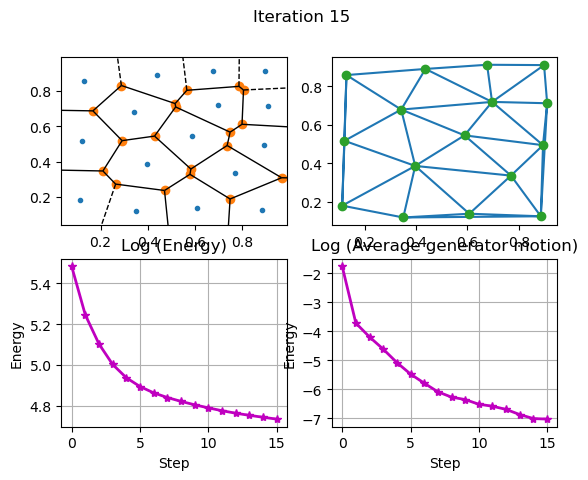

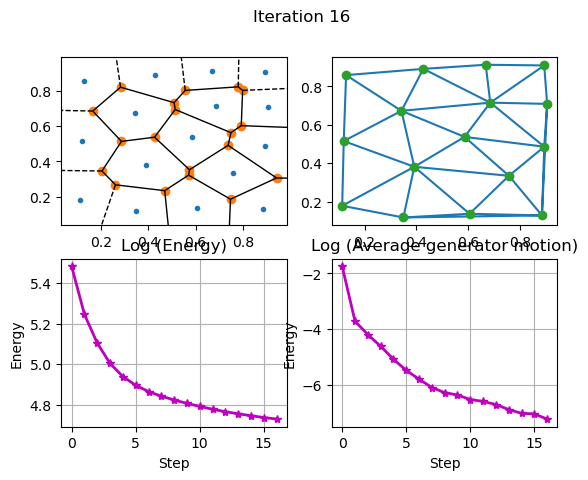

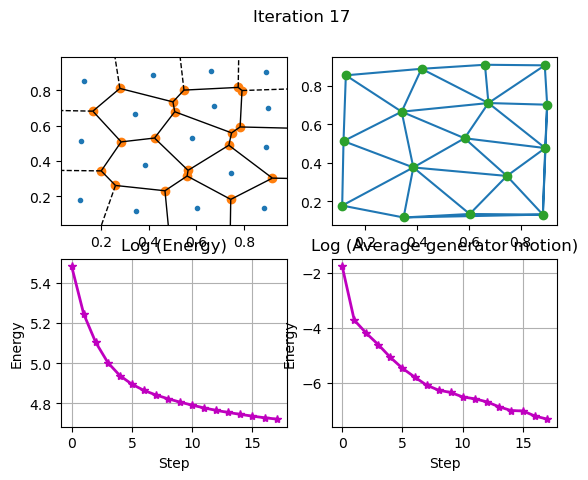

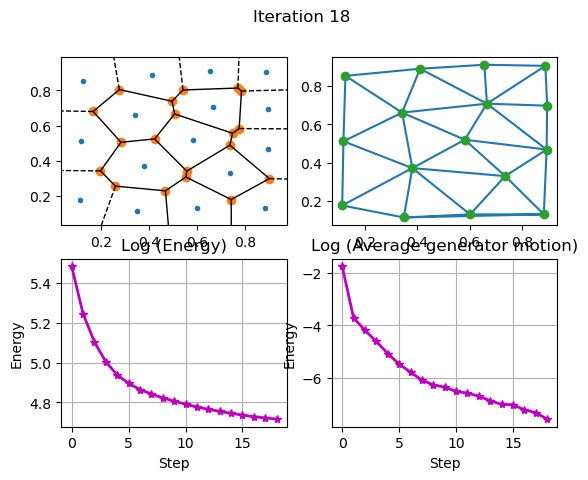

  Graphics saved as " final.png "


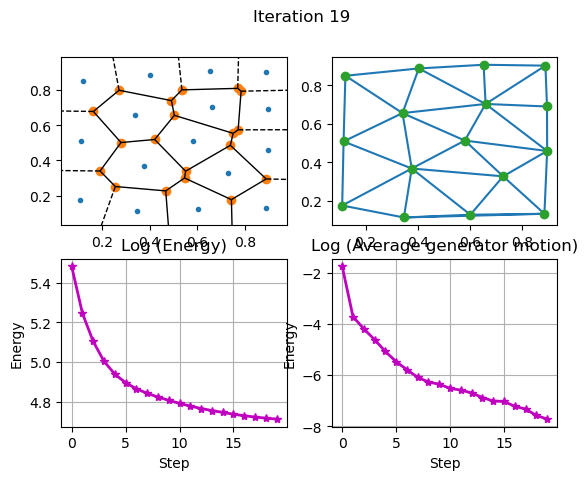


cvt_2d_sampling_test()
  Normal end of execution.
Mon Dec  4 01:43:04 2023


In [1]:
#! /usr/bin/env python3
#
def cvt_2d_sampling ( g_num = 0, it_num = 0, s1d_num = 0 ):

#*****************************************************************************80
#
## cvt_2d_sampling() carries out the Lloyd algorithm in a 2D unit box.
#
#  Discussion:
#
#    This program is a variation of the CVT_2D_LLOYD method.
#
#    Instead of using an exact technique to determine the Voronoi
#    regions, it uses sampling.
#
#  Licensing:
#
#    This code is distributed under the GNU LGPL license.
#
#  Modified:
#
#    16 September 2016
#
#  Author:
#
#    John Burkardt
#
#  Input:
#
#    integer G_NUM, the number of generators.
#    A value of 50 is reasonable.
#
#    integer IT_NUM, the number of CVT iterations.
#    A value of 20 or 50 might be reasonable.
#
#    integer S1D_NUM, the number of sample points to use
#    when estimating the Voronoi regions.
#    A value of 1,000 is too low.  A value of 1,000,000 is somewhat high.
#
  import numpy as np
  import matplotlib.pyplot as plt
  import platform
  from scipy.spatial import Delaunay
  from scipy.spatial import Voronoi
  from scipy.spatial import voronoi_plot_2d
  from scipy import argmin
  from scipy import inner

  print ( '' )
  print ( 'cvt_2d_sampling():' )
  print ( '  Python version: %s' % ( platform.python_version ( ) ) )
  print ( '  Use sampling to approximate Lloyd\'s algorithm' )
  print ( '  in the 2D unit square.' )

  if ( g_num <= 0 ):
    prompt = '  Enter number of generators:  '
    inp = raw_input ( prompt )
    g_num = int ( inp )

  if ( it_num <= 0 ):
    prompt = '  Enter number of iterations:  '
    inp = raw_input ( prompt )
    it_num = int ( inp )

  if ( s1d_num <= 0 ):
    prompt = '  Enter number of sample points:  '
    inp = raw_input ( prompt )
    s1d_num = int ( inp )

  s_num = s1d_num * s1d_num

  print ( '' )
  print ( '  Number of generators is %d' % ( g_num ) )
  print ( '  Number of iterations is %d' % ( it_num ) )
  print ( '  Number of 1d samples is %d' % ( s1d_num ) )
  print ( '  Number of 2d samples is %d' % ( s_num ) )
#
#  Initialize the generators.
#
  gx = np.random.rand ( g_num )
  gy = np.random.rand ( g_num )
#
#  Generate a fixed grid of sample points.
#  Since MESHGRID's documentation is too obscure, let's just do it the hard way.
#
  s_1d = np.linspace ( 0.0, 1.0, s1d_num )
  sx = np.zeros ( s_num )
  sy = np.zeros ( s_num )
  s = np.zeros ( [ s_num, 2 ] )
  k = 0
  for j in range ( 0, s1d_num ):
    for i in range ( 0, s1d_num ):
      sx[k] = s_1d[i]
      sy[k] = s_1d[j]
      s[k,0] = s_1d[i]
      s[k,1] = s_1d[j]
      k = k + 1
#
#  Carry out the iteration.
#
#  ERROR: I want to plot log ( E ) and log ( GM ) every step.
#  I should initialize E and GM to NAN's, assuming that, like
#  MATLAB, they won't plot.
#
  step = np.zeros ( it_num )
  e = 1.0E-10 * np.ones ( it_num )
  gm = 1.0E-10 * np.ones ( it_num )

  for it in range ( 0, it_num ):

    step[it] = it
#
#  Compute the Delaunay triangle information T for the current nodes.
#  Since my version of NUMPY is too old, I can't use the STACK command
#  to combine two vectors into an array.
#
    g = np.zeros ( [ g_num, 2 ] )
    g[:,0] = gx[:]
    g[:,1] = gy[:]
    tri = Delaunay ( g )
#
#  Display the Voronoi cells.
#
    subfig1 = plt.subplot ( 2, 2, 1 )   
    vor = Voronoi ( g )
    voronoi_plot_2d ( vor, ax = subfig1 )
#
#  Display the Delaunay triangulation.
#
    subfig2 = plt.subplot ( 2, 2, 2 )
    plt.triplot ( gx, gy, tri.simplices.copy( ) )
    plt.plot ( gx, gy, 'o' )
#
#  For each sample point, find K, the index of the nearest generator.
#
    k = [ argmin ( [ inner ( gg - ss, gg - ss ) for gg in g ] ) for ss in s ]
#
#  For each generator, M counts the number of sample points it is nearest to.
#  Note that for a nonuniform density, we just set W to the density.
#
    w = np.ones ( s_num )
    m = np.bincount ( k, weights = w )
#
#  G is the average of the sample points it is nearest to.
#  Where M is zero, we shouldn't modify G.
#
    gx_new = np.bincount ( k, weights = sx )
    gy_new = np.bincount ( k, weights = sy )

    for i in range ( 0, g_num ):
      if ( 0 < m[i] ):
        gx_new[i] = gx_new[i] / float ( m[i] )
        gy_new[i] = gy_new[i] / float ( m[i] )
#
#  Compute the energy.
#
    e[it] = 0.0
    for i in range ( 0, s_num ):
      e[it] = e[it] + ( sx[i] - gx_new[k[i]] ) ** 2 \
                    + ( sy[i] - gy_new[k[i]] ) ** 2
#
#  Display the log of the energy.
#
    subfig3 = plt.subplot ( 2, 2, 3 )
    plt.plot ( step[0:it+1], np.log ( e[0:it+1] ), 'm-*', linewidth = 2 )
    plt.title ( 'Log (Energy)' )
    plt.xlabel ( 'Step' )
    plt.ylabel ( 'Energy' )
    plt.grid ( True )
#
#  Compute the generator motion.
#
    for i in range ( 0, g_num ):
      gm[it] = gm[it] + ( gx_new[i] - gx[i] ) ** 2 \
                      + ( gy_new[i] - gy[i] ) ** 2
#
#  Display the generator motion.
#
    subfig4 = plt.subplot ( 2, 2, 4 )
    plt.plot ( step[0:it+1], np.log ( gm[0:it+1] ), 'm-*', linewidth = 2 )
    plt.title ( 'Log (Average generator motion)' )
    plt.xlabel ( 'Step' )
    plt.ylabel ( 'Energy' )
    plt.grid ( True )
#
#  Put a title on the plot.
#
    super_title = 'Iteration ' + str ( it )
    plt.suptitle ( super_title )
#
#  Save the first and last plots.
#
    if ( it == 0 ):
      filename = 'initial.png'
      plt.savefig ( filename )
      print ( '  Graphics saved as "', filename, '"' )
    elif ( it == it_num - 1 ):
      filename = 'final.png'
      plt.savefig ( filename )
      print ( '  Graphics saved as "', filename, '"' )

    plt.show ( block = False )
    plt.close ( )
#
#  Update the generators.
#
    gx = gx_new
    gy = gy_new

  return

def cvt_2d_sampling_test ( ):

#*****************************************************************************80
#
## cvt_2d_sampling_test() tests cvt_2d_sampling().
#
#  Licensing:
#
#    This code is distributed under the GNU LGPL license.
#
#  Modified:
#
#    23 March 2021
#
#  Author:
#
#    John Burkardt
#
  import platform

  print ( '' )
  print ( 'cvt_2d_sampling_test():' )
  print ( '  Python version: %s' % ( platform.python_version ( ) ) )
  print ( '  Test cvt_2d_sampling()' )

  cvt_2d_sampling ( 16, 20, 100 )
#
#  Terminate.
#
  print ( '' )
  print ( 'cvt_2d_sampling_test()' )
  print ( '  Normal end of execution.' )

  return

def timestamp ( ):

#*****************************************************************************80
#
## timestamp() prints the date as a timestamp.
#
#  Licensing:
#
#    This code is distributed under the GNU LGPL license. 
#
#  Modified:
#
#    06 April 2013
#
#  Author:
#
#    John Burkardt
#
  import time

  t = time.time ( )
  print ( time.ctime ( t ) )

  return

if ( __name__ == '__main__' ):
  timestamp ( )
  cvt_2d_sampling_test ( )
  timestamp ( )

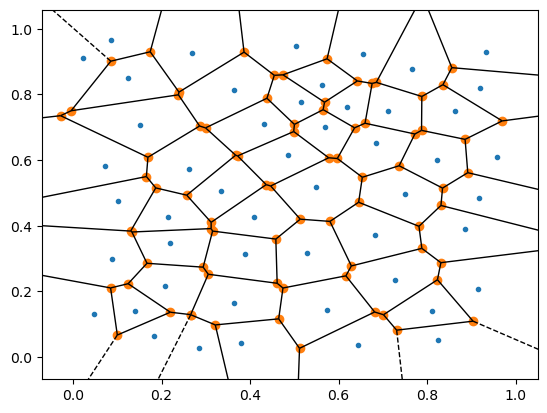

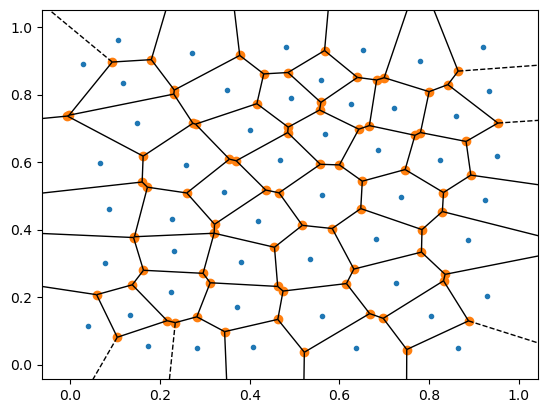

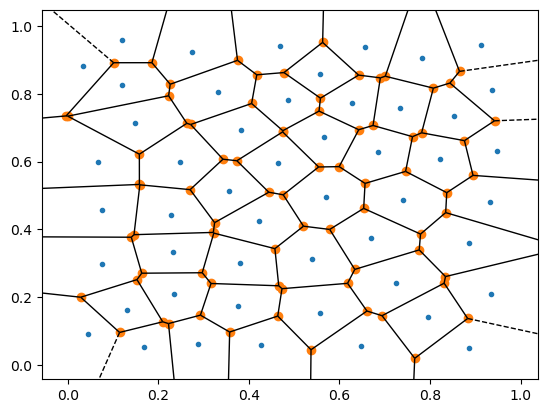

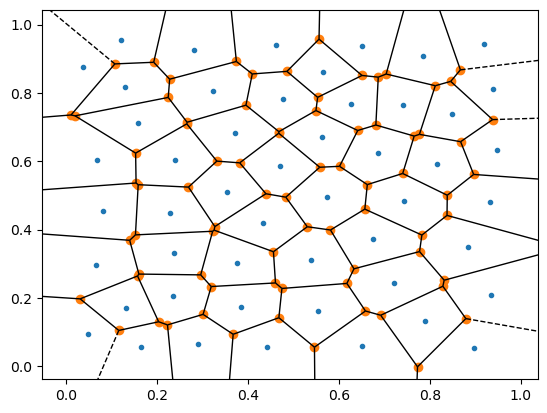

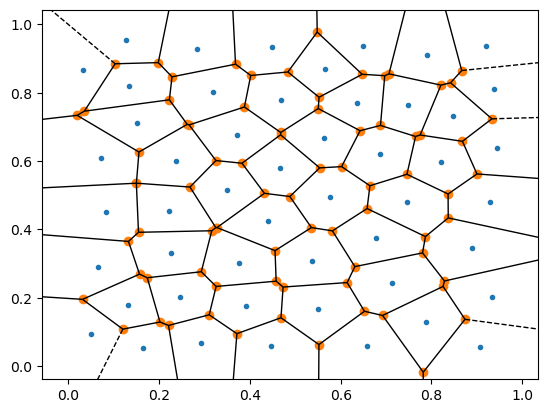

...

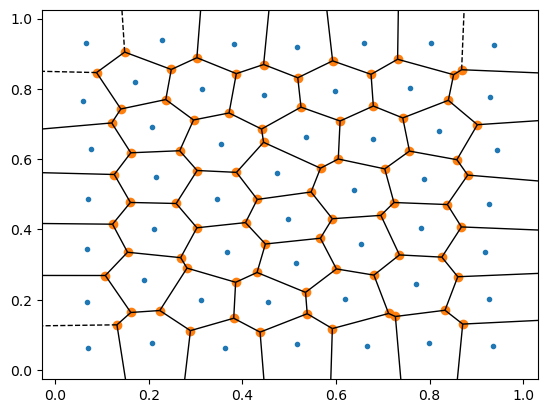

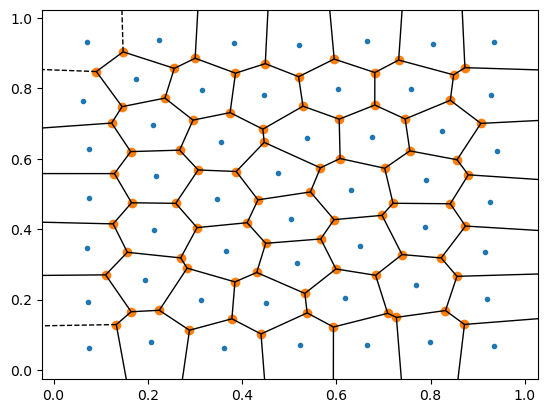

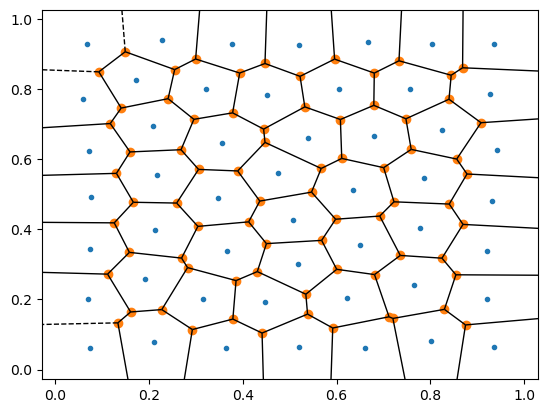

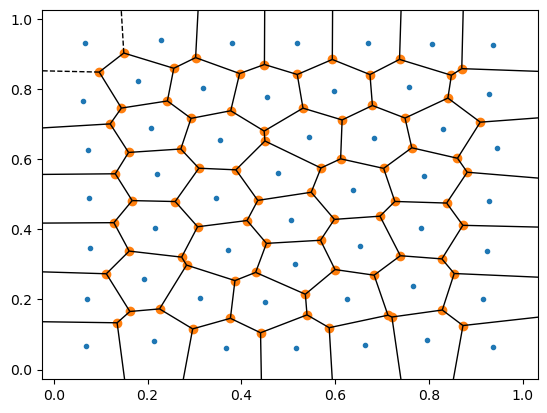

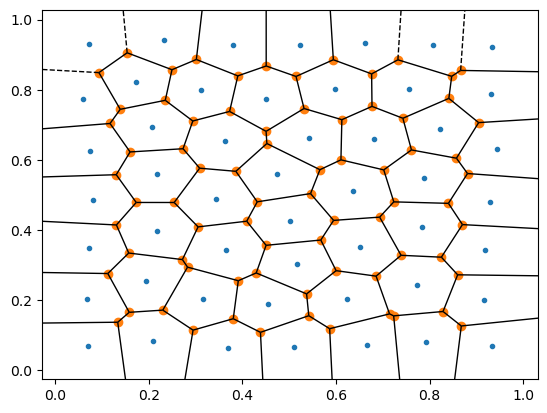

[[0.63541967 0.5111115 ]
 [0.07097519 0.92916335]
 [0.6655951  0.07251336]
 [0.78353996 0.40819381]
 [0.07041293 0.06746652]
 [0.75594032 0.80328794]
 [0.20595337 0.69337286]
 [0.79207411 0.08149112]
 [0.54155426 0.66097821]
 [0.59715962 0.80193866]
 [0.66228153 0.93404686]
 [0.51740424 0.30236244]
 [0.45049874 0.77444633]
 [0.51077876 0.06684336]
 [0.21671827 0.55977828]
 [0.0749938  0.6242694 ]
 [0.50161664 0.42480697]
 [0.47413001 0.5585275 ]
 [0.37934988 0.92749452]
 [0.8228961  0.68723613]
 [0.93044512 0.78641393]
 [0.36580034 0.34294451]
 [0.31131597 0.79854517]
 [0.36179548 0.65245551]
 [0.681612   0.65855232]
 [0.06841705 0.20374078]
 [0.19363712 0.25558374]
 [0.07149394 0.34894755]
 [0.45460084 0.1891331 ]
 [0.23178924 0.94042314]
 [0.78854977 0.54720353]
 [0.05941515 0.77245956]
 [0.93344203 0.92058809]
 [0.34296911 0.48950732]
 [0.36938951 0.06163465]
 [0.20879959 0.08158459]
 [0.52211236 0.92751842]
 [0.92855707 0.47996418]
 [0.08059696 0.48635649]
 [0.21655021 0.39662553]


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import Voronoi, voronoi_plot_2d

def lloyds_algorithm_2d(num_generators, num_iterations, num_samples):
    # Initialize generators randomly within the unit square
    generators = np.random.rand(num_generators, 2)

    for _ in range(num_iterations):
        # Sample random points within the unit square
        samples = np.random.rand(num_samples, 2)

        # Assign each sample to the nearest generator
        nearest_index = np.argmin(np.linalg.norm(samples[:, np.newaxis, :] - generators[np.newaxis, :, :], axis=2), axis=1)

        # Move each generator to the centroid of its assigned samples
        for i in range(num_generators):
            assigned_samples = samples[nearest_index == i]
            if len(assigned_samples) > 0:
                generators[i] = np.mean(assigned_samples, axis=0)

        # Optionally, you can plot the current state of the Voronoi diagram
        vor = Voronoi(generators)
        voronoi_plot_2d(vor)
        plt.show()

    return generators

# Use the function with parameters
num_generators = 50
num_iterations = 100
num_samples = 10000
final_generators = lloyds_algorithm_2d(num_generators, num_iterations, num_samples)

# Final generators are the centroids of the Voronoi cells in the unit square
print(final_generators)

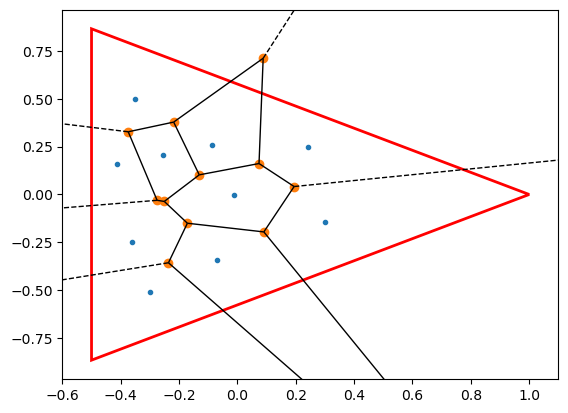

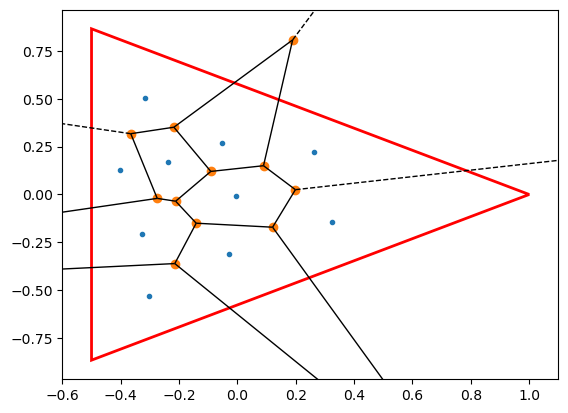

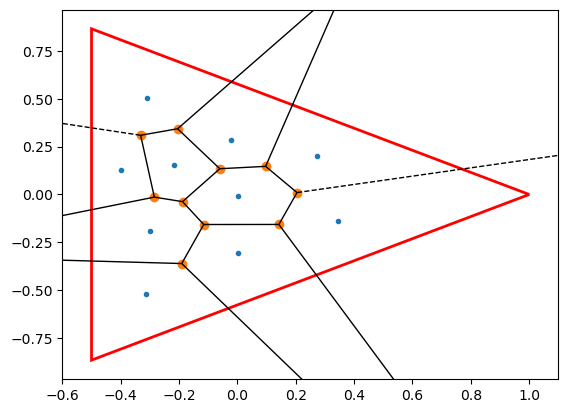

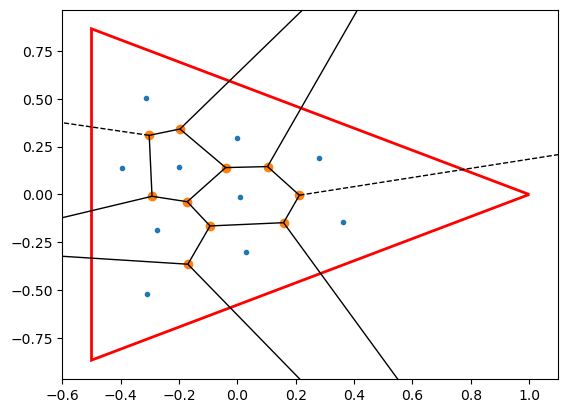

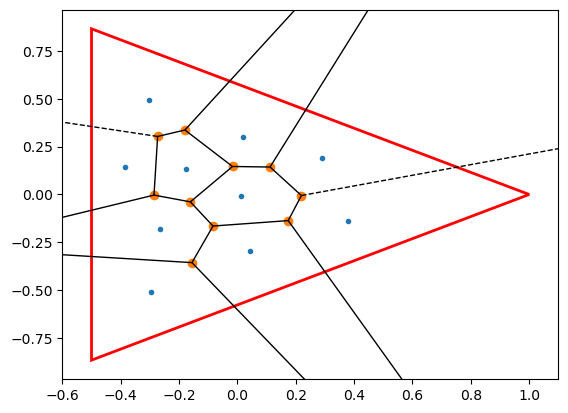

...

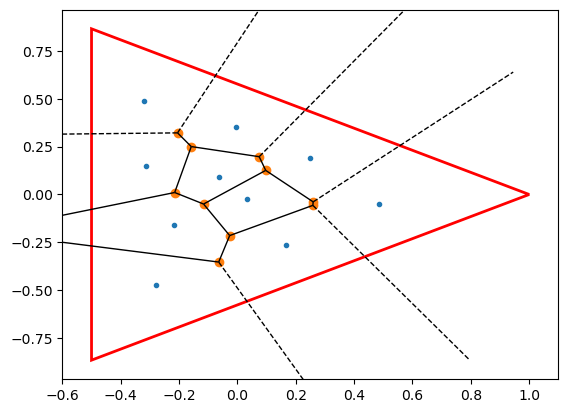

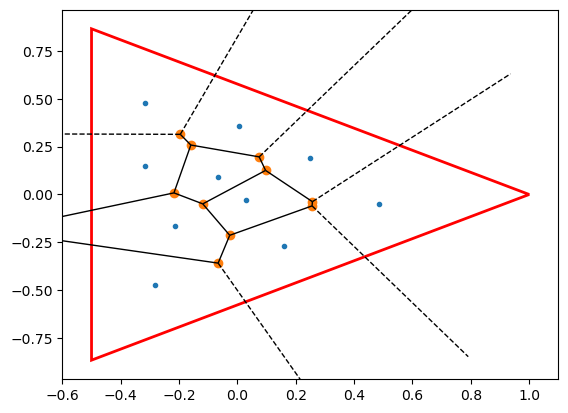

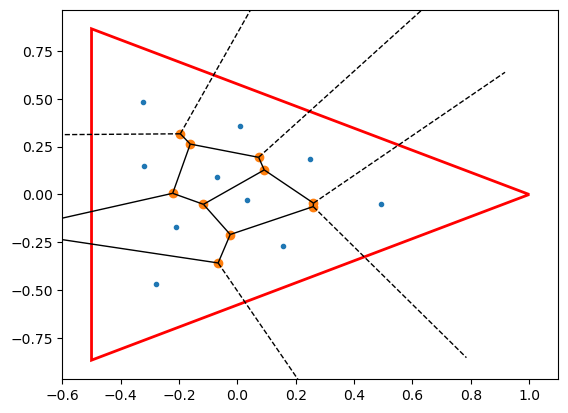

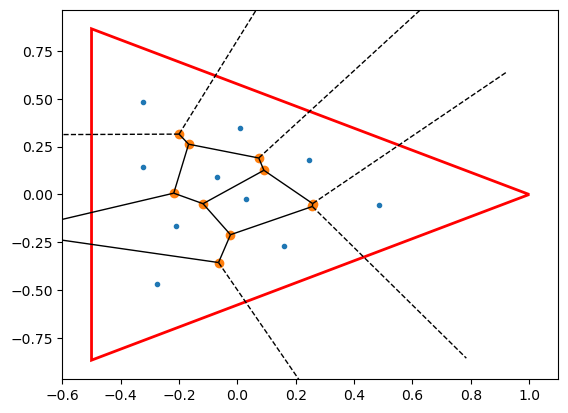

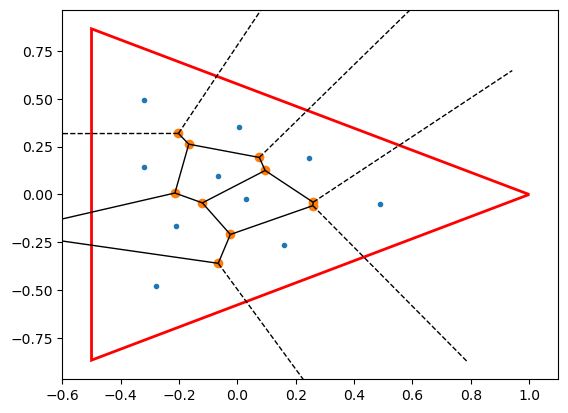

[[ 0.00578852  0.35016312]
 [ 0.15862131 -0.26658747]
 [ 0.48944309 -0.05187285]
 [-0.06668701  0.09756392]
 [ 0.24632865  0.1890278 ]
 [-0.32018297  0.49302404]
 [ 0.03004203 -0.02521221]
 [-0.21080585 -0.16499228]
 [-0.31952718  0.14455369]
 [-0.27874315 -0.47651682]]


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import Voronoi, voronoi_plot_2d
import matplotlib.patches as patches

def generate_polygon_vertices(sides, radius):
    # Angle between vertices
    theta = np.linspace(0, 2 * np.pi, sides, endpoint=False)
    # Vertices of the polygon
    vertices = radius * np.c_[np.cos(theta), np.sin(theta)]
    return vertices

def sample_points_inside_polygon(vertices, num_samples):
    # Generate points inside the convex hull of the polygon vertices
    samples = []
    while len(samples) < num_samples:
        point = np.random.rand(2) * 2 - 1  # Generate point in [-1, 1]x[-1, 1]
        point *= np.random.rand()  # Scale point to be inside unit circle
        if np.all(np.cross(vertices - np.roll(vertices, -1, axis=0), point - vertices) <= 0):
            # All cross products must be non-positive for the point to be inside
            samples.append(point)
    return np.array(samples)

def lloyds_algorithm_polygon(sides, radius, num_generators, num_iterations, num_samples):
    vertices = generate_polygon_vertices(sides, radius)
    generators = sample_points_inside_polygon(vertices, num_generators)

    # Create a Polygon patch
    polygon = patches.Polygon(vertices, closed=True, edgecolor='r', facecolor='none')

    for _ in range(num_iterations):
        samples = sample_points_inside_polygon(vertices, num_samples)
        nearest_index = np.argmin(np.linalg.norm(samples[:, np.newaxis, :] - generators[np.newaxis, :, :], axis=2), axis=1)

        for i in range(num_generators):
            assigned_samples = samples[nearest_index == i]
            if len(assigned_samples) > 0:
                generators[i] = np.mean(assigned_samples, axis=0)

        # Optional: Plotting the current Voronoi diagram
#         vor = Voronoi(generators)
#         voronoi_plot_2d(vor)
#         plt.show()
        
        # Optional: Plotting the current Voronoi diagram
        vor = Voronoi(generators)
        fig, ax = plt.subplots()

        # Plot the Voronoi diagram
        voronoi_plot_2d(vor, ax=ax)

        # Plot the original polygon shape by connecting the vertices
        # Assuming 'vertices' is an array of the polygon vertices
        polygon = plt.Polygon(vertices, closed=True, fill=None, edgecolor='r', linewidth=2)
        ax.add_patch(polygon)

        # Set the axis limits to include the entire polygon
        margin = 0.1 * radius
        plt.xlim(min(vertices[:,0]) - margin, max(vertices[:,0]) + margin)
        plt.ylim(min(vertices[:,1]) - margin, max(vertices[:,1]) + margin)

        plt.show()

    return generators

# Parameters for the polygon
sides = 3  # for a hexagon
radius = 1  # Can be set to any value

# Use the function with parameters
num_generators = 10
num_iterations = 100
num_samples = 10000
final_generators = lloyds_algorithm_polygon(sides, radius, num_generators, num_iterations, num_samples)
# distance closest point, predefined distance, shape classifire,
print(final_generators)